In [289]:
# !pip install anomalib
# !pip install matplotlib
# !pip install numpy
# !pip install tensorboard
# !pip install torch==2.7.1 torchvision==0.22.1 torchaudio==2.7.1 --index-url https://download.pytorch.org/whl/cu128
# !pip install kaggle

In [290]:
# 2. Импорт необходимых модулей
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import json
import random
from sklearn.model_selection import train_test_split

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.optim as optim
import torch.nn.functional as torch_f
import torch.nn as nn

from anomalib.models.image.fastflow.loss import FastflowLoss
from anomalib.models.image.fastflow.torch_model import FastflowModel

from sklearn.metrics import confusion_matrix
import cv2
from skimage import data, filters, measure
from skimage.segmentation import clear_border
# import warnings
# warnings.filterwarnings('ignore')

# Сборка датасетов

Для предобработки картинок и постобработке карт аномалий

In [291]:
dataset_path = os.path.join("datasets", "MVTecAD")
class_name = "metal_nut"
test_groups = ["bent", "scratch", "good"]
image_size = 384

In [292]:
def get_augmented_transformer(image_size):
    return transforms.Compose([
        # transforms.Resize((image_size, image_size)),
        transforms.RandomResizedCrop((image_size, image_size), scale=(0.9, 1.1), ratio=(1, 1)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomRotation(degrees=10),
        transforms.ColorJitter(brightness=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

def get_transformer(image_size):
    return transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

def show_tensor(tensor):
    pil_img = transforms.ToPILImage()
    pil_img(tensor).show()


def postprocess_anomaly_map(anomaly_map, true_img_size):
    ndims = anomaly_map.ndim
    while anomaly_map.ndim < 4:
        anomaly_map = anomaly_map.unsqueeze(0)

    upsampled_mask = torch_f.interpolate(
        anomaly_map,
        size=true_img_size,
        mode='bilinear',
        align_corners=False
    )
    
    return upsampled_mask.squeeze()

In [293]:
# path = os.path.join(dataset_path, class_name, "test", test_groups[0], "003.png")
# print(path)
# img = Image.open(path).convert('RGB')
# img = get_transformer(256)(img)
# print(img.shape)
# # img = img[0, :, :]
# img = postprocess_anomaly_map(img.unsqueeze(0), true_img_size=(900, 900))
# print(img.shape)
# print(img.max())
# print(img.dtype)
# show_tensor(img)

Датасеты

In [294]:
class Train_Dataset(Dataset):
    def __init__(self, root_dir, category, transform=None, split='train', good_class_dir="good"):
        self.root_dir = os.path.join(root_dir, category, split)
        self.transform = transform
        self.image_paths = []
        
        for class_name in os.listdir(self.root_dir):
            if class_name == good_class_dir:
                class_path = os.path.join(self.root_dir, class_name)
                if os.path.isdir(class_path):
                    for img_name in os.listdir(class_path):
                        if img_name.endswith(('.png', '.jpg', '.jpeg')):
                            self.image_paths.append(os.path.join(class_path, img_name))
        
        # print(f"Loaded {len(self.image_paths)} images from {split} set")
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image
    

class Segmentation_Dataset(Dataset):
    def __init__(self, root_dir, category, img_transform=None, mask_transform=None, imgs_dir="test", test_classes = [], masks_dir="ground_truth", good_class_dir="good"):
        self.img_transform = img_transform
        self.mask_transform = mask_transform
        self.base_transform = transforms.Compose([transforms.ToTensor()])

        imgs_path = os.path.join(root_dir, category, imgs_dir)
        image_paths = []
        for class_name in os.listdir(imgs_path):
            if len(test_classes) > 0 and not (class_name in test_classes):
                continue
            if class_name != good_class_dir:
                class_path = os.path.join(imgs_path, class_name)
                if os.path.isdir(class_path):
                    for img_name in os.listdir(class_path):
                        if img_name.endswith(('.png', '.jpg', '.jpeg')):
                            image_paths.append(os.path.join(class_path, img_name))
        
        masks_path = os.path.join(root_dir, category, masks_dir)
        mask_paths = []
        for class_name in os.listdir(masks_path):
            if len(test_classes) > 0 and not (class_name in test_classes):
                continue
            if class_name != good_class_dir:
                class_path = os.path.join(masks_path, class_name)
                if os.path.isdir(class_path):
                    for mask_name in os.listdir(class_path):
                        if mask_name.endswith(('.png', '.jpg', '.jpeg')):
                            mask_paths.append(os.path.join(class_path, mask_name))
        
        self.images = sorted(image_paths)
        self.masks = sorted(mask_paths)

        # print(f"Loaded {len(self.images)} images and masks for segmentation task")
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        image = Image.open(self.images[idx]).convert('RGB')
        mask = Image.open(self.masks[idx]).convert('RGB')

        image = self.img_transform(image) if self.img_transform else self.base_transform(image)
        mask = self.mask_transform(mask) if self.mask_transform else self.base_transform(mask)
        
        return (image, mask)
    


class Classification_Dataset(Dataset):
    def __init__(self, root_dir, category, img_transform=None, imgs_dir="test", test_classes = [], good_class_dir="good"):
        self.img_transform = img_transform
        self.base_transform = transforms.Compose([transforms.ToTensor()])

        imgs_path = os.path.join(root_dir, category, imgs_dir)
        image_paths = []
        image_labels = []
        for class_name in os.listdir(imgs_path):
            if len(test_classes) > 0 and not (class_name in test_classes):
                continue
            class_path = os.path.join(imgs_path, class_name)
            if os.path.isdir(class_path):
                for img_name in os.listdir(class_path):
                    if img_name.endswith(('.png', '.jpg', '.jpeg')):
                        image_paths.append(os.path.join(class_path, img_name))
                        if class_name != good_class_dir:
                            image_labels.append(1)
                        else:
                            image_labels.append(0)

        self.images = image_paths
        self.labels = image_labels
                        
        # print(f"Loaded {len(self.images)} images with labels for classification")
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        image = Image.open(self.images[idx]).convert('RGB')
        label = self.labels[idx]

        image = self.img_transform(image) if self.img_transform else self.base_transform(image)
        
        return (image, label)

In [295]:
# train_dataset = Train_Dataset(dataset_path, class_name, get_augmented_transformer(256))
train_dataset = Train_Dataset(dataset_path, class_name, transform=get_augmented_transformer(image_size))
print(f"Train dataset size: {len(train_dataset)}")

segmentation_dataset = Segmentation_Dataset(dataset_path, class_name, img_transform=get_transformer(image_size), mask_transform=get_transformer(image_size), test_classes=test_groups)
segmentation_val_dataset, segmentation_test_dataset = train_test_split(segmentation_dataset, test_size=0.5, random_state=42, shuffle=True)
print(f"Segmentation dataset size: validation - {len(segmentation_val_dataset)}, test - {len(segmentation_test_dataset)}")

classification_dataset = Classification_Dataset(dataset_path, class_name, img_transform=get_transformer(image_size), test_classes=test_groups)
classification_val_dataset, classification_test_dataset = train_test_split(classification_dataset, stratify=[i[1] for i in classification_dataset], test_size=0.5, random_state=42, shuffle=True)
print(f"Classification dataset size: validation - {len(classification_val_dataset)}, test - {len(classification_test_dataset)}")

Train dataset size: 220
Segmentation dataset size: validation - 24, test - 24
Classification dataset size: validation - 35, test - 35


# Метрики качества

In [316]:
import numpy as np
from sklearn.metrics import average_precision_score, roc_auc_score, roc_auc_score
import cv2
import matplotlib.pyplot as plt
from skimage import measure

def img2mask(img):
    mask = img if img.ndim <= 2 else img.squeeze()
    if mask.ndim == 3:
        mask = mask[0, :, :]
    if mask.ndim != 2:
        print("Wrong dimensions")
        raise ValueError
    return mask

def pixel_avg_precision(pred_anomaly_map, true_mask):
    pred_anomaly_map = img2mask(pred_anomaly_map)
    true_mask = img2mask(true_mask)

    y_true = (true_mask.flatten().cpu().numpy() > 0.5).astype(int)
    y_scores = pred_anomaly_map.flatten().cpu().numpy()

    if y_scores.max() > 1.0 or y_scores.min() < 0.0:
        print(f"predicted masks scores are not from [0, 1]")
        raise ValueError

    ap = average_precision_score(y_true, y_scores)
    return ap if not np.isnan(ap) else 0.0


def pixel_roc_auc(pred_anomaly_map, true_mask):
    pred_anomaly_map = img2mask(pred_anomaly_map)
    true_mask = img2mask(true_mask)

    y_true = (true_mask.flatten().cpu().numpy() > 0.5).astype(int)
    y_scores = pred_anomaly_map.flatten().cpu().numpy()

    if y_scores.max() > 1.0 or y_scores.min() < 0.0:
        print(f"predicted masks scores are not from [0, 1]")
        raise ValueError

    auc = roc_auc_score(y_true, y_scores)
    return auc if not np.isnan(auc) else 0.5


def predict_label(pred_anomaly_map, k=0.001):
    """Возвращает скор картинки по среднему k наибольших пикселей"""
    pred_anomaly_map = img2mask(pred_anomaly_map)

    y_scores = pred_anomaly_map.flatten().cpu()
    top_k_scores = torch.topk(y_scores, int(k * len(y_scores)))

    return torch.mean(top_k_scores.values)


def plot_training_curves(metrics: list, metric_names: list, log_dir: str, plot_name: str, log_y=False):
    os.makedirs(log_dir, exist_ok=True)

    plt.figure(figsize=(10, 6))
    for metric, metric_name in zip(metrics, metric_names):
        plt.plot(metric, label=metric_name, marker='o')
    plt.xlabel('Epoch')
    plt.ylabel('Metric')
    if log_y:
        plt.yscale('log')
    plt.title(f'Training and Validation {metric_name}')
    plt.legend()
    plt.grid(True)
    plt.savefig(os.path.join(log_dir, plot_name))
    plt.show()


def visualize_results(original_image, anomaly_map, true_mask=None, score=None, figsize=(15, 5), alpha=0.7, cmap='jet'):
    denormalize = transforms.Compose([
        transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225], std=[1/0.229, 1/0.224, 1/0.225])
    ])
    original_image = denormalize(original_image)
    
    original_image = postprocess_anomaly_map(original_image, true_img_size=(original_image.shape[-2], original_image.shape[-1]))
    original_image = original_image if original_image.ndim <= 3 else original_image.squeeze()
    if not true_mask is None:
        true_mask = true_mask if true_mask.ndim <= 3 else true_mask.squeeze()
    anomaly_map = anomaly_map if anomaly_map.ndim <= 3 else anomaly_map.squeeze()

    to_pil = transforms.ToPILImage()
    if isinstance(original_image, torch.Tensor):
        original_image = to_pil(original_image)

    fig, axes = plt.subplots(1, 3, figsize=figsize)
    
    # Оригинальное изображение
    axes[0].imshow(original_image)
    axes[0].set_title('Original image', fontsize=14)
    axes[0].axis('off')
    
    # Маска
    if not (true_mask is None):
        true_mask = true_mask if true_mask.ndim <= 3 else true_mask.squeeze()
        true_mask = img2mask(true_mask)
        if isinstance(true_mask, torch.Tensor):
            true_mask = true_mask.cpu().numpy()
        axes[1].imshow(original_image)
        heatmap = axes[1].imshow(true_mask, cmap=cmap, alpha=alpha)
        axes[1].set_title('Input + True Mask', fontsize=14)
        axes[1].axis('off')
        plt.colorbar(heatmap, ax=axes[1], fraction=0.046, pad=0.04)


    # Карта аномалий
    anomaly_map = img2mask(anomaly_map)
    if isinstance(anomaly_map, torch.Tensor):
        anomaly_map = anomaly_map.squeeze().cpu().numpy()

    axes[2].imshow(original_image)
    heatmap = axes[2].imshow(anomaly_map, cmap=cmap, alpha=alpha)
    axes[2].set_title('Input + Anomaly Map', fontsize=14)
    axes[2].axis('off')
    plt.colorbar(heatmap, ax=axes[2], fraction=0.046, pad=0.04)
    
    plt.tight_layout()
    plt.show()

# Обучение модели

In [297]:
device="cuda" if torch.cuda.is_available() else "cpu"
print(device)
print(f"Название GPU: {torch.cuda.get_device_name(torch.cuda.current_device())}")

cuda
Название GPU: NVIDIA GeForce RTX 3070 Ti Laptop GPU


In [298]:
# Функция для заморозки весов экстрактора фичей
def freeze_feature_extractor(model):
    """Замораживает веса предобученного экстрактора фичей"""
    # Находим экстрактор фичей в модели (обычно это backbone)
    frozen_params_num = 0
    if hasattr(model, 'feature_extractor'):
        for param in model.feature_extractor.parameters():
            param.requires_grad = False
            frozen_params_num += param.numel()
    print(f"Parameters frozen: {frozen_params_num}")

# Функция для получения обучаемых параметров
def get_trainable_parameters(model):
    """Возвращает список обучаемых параметров"""
    trainable_params = []
    train_params_num = 0
    for name, param in model.named_parameters():
        if param.requires_grad:
            trainable_params.append(param)
            train_params_num += param.numel()
    print(f"Trainable parameters: {train_params_num}")
    return trainable_params

In [299]:
val_good_len = 0
with torch.no_grad():
    for i in tqdm(range(len(classification_test_dataset)), desc="Classification Val", leave=False):
        img, true_label = classification_test_dataset[i]
        if true_label:
            continue
        val_good_len += 1

print(val_good_len)

11


In [ ]:
import torch
import torch.nn as nn
from torch.optim import Adam, AdamW
from tqdm import tqdm
import os
from torch.optim.lr_scheduler import LinearLR, CosineAnnealingLR, SequentialLR

def train_fastflow_with_validation(
    model,
    train_dataset,
    segmentation_dataset=None,
    classification_dataset=None,
    num_epochs=10,
    learning_rate=1e-3,
    weight_decay=1e-3,
    device=device,
    log_interval=1,
    log_dir="../experiments",
    freeze_extractor=True,
    batch_size=8,
    num_workers=0,
    resume_from_checkpoint=True,
    early_stopping_patience=5,
    early_stopping_metric="Pixels_ROC_AUC",
    early_stopping_mode="max"
):
    model = model.to(device)
    criterion = FastflowLoss()
    os.makedirs(log_dir, exist_ok=True)
    checkpoints_dir = os.path.join(log_dir, "middle_logs")
    os.makedirs(checkpoints_dir, exist_ok=True)

    total_params = sum(p.numel() for p in model.parameters())
    print(f"Total parameters number: {total_params}")
    if freeze_extractor:
        freeze_feature_extractor(model)
    trainable_params = get_trainable_parameters(model)
    optimizer = optim.AdamW(trainable_params, lr=learning_rate, weight_decay=weight_decay)

    dataloader = DataLoader(
        dataset=train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers
    )

    # scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=3 * len(dataloader), T_mult=2, eta_min=1e-11)
    total_steps = num_epochs * len(dataloader)
    warmup_steps = int(0.1 * total_steps)
    warmup_scheduler = LinearLR(
        optimizer,
        start_factor=0.05,  # или 0.01–0.1; можно также start_factor=0.0 → но не для Adam-like
        end_factor=1.0,
        total_iters=warmup_steps
    )
    main_scheduler = CosineAnnealingLR(
        optimizer,
        T_max=(total_steps - warmup_steps) // 3,
        eta_min=1e-9
    )
    scheduler = SequentialLR(
        optimizer,
        schedulers=[warmup_scheduler, main_scheduler],
        milestones=[warmup_steps]
    )

    # Early stopping setup
    best_score = -float('inf') if early_stopping_mode == "max" else float('inf')
    epochs_without_improvement = 0
    best_model_state = None

    checkpoint_path = os.path.join(checkpoints_dir, "checkpoint.pth")
    # Загрузка чекпоинта, если есть
    start_epoch = 0
    epoch_scores = {"Train_Loss": []}
    if resume_from_checkpoint and os.path.exists(checkpoint_path):
        print(f"Loading checkpoint from {checkpoint_path}...")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        model.load_state_dict(checkpoint["model_state_dict"])
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
        if "scheduler_state_dict" in checkpoint:
            scheduler.load_state_dict(checkpoint["scheduler_state_dict"])
        start_epoch = checkpoint["epoch"]
        epoch_scores = checkpoint["epoch_scores"]
        print(f"Resuming from epoch {start_epoch + 1}")
    else:
        print("Starting training from scratch...")

    epoch_scores = {"Train_Loss": []}
    for epoch in range(start_epoch, num_epochs):
        # Обучение
        model.train()
        total_loss = 0.0
        for batch in tqdm(dataloader, desc=f"Train Epoch {epoch+1}/{num_epochs}", leave=False):
            if isinstance(batch, (list, tuple)):
                images = batch[0]
            else:
                images = batch
            images = images.to(device)

            optimizer.zero_grad()
            with torch.set_grad_enabled(True):
                outputs = model(images)
                loss = criterion(outputs[0], outputs[1])
                
                loss.backward()
                optimizer.step()
                scheduler.step()
            
            total_loss += loss.item()

        avg_loss = total_loss / len(dataloader)
        if (epoch + 1) % log_interval == 0:
            print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {avg_loss:.6f}")

        epoch_scores["Train_Loss"].append(avg_loss)


        # Валидация функции потерь
        if classification_dataset is not None:
            if not ("Classification_ROC_AUC" in epoch_scores):
                epoch_scores["Validation_Loss"] = []

            total_loss = 0
            good_val_len = 0
            with torch.no_grad():
                for i in tqdm(range(len(classification_dataset)), desc="Classification Val", leave=False):
                    img, true_label = classification_dataset[i]
                    if true_label:
                        continue
                    img = img.unsqueeze(0).to(device)
                    loss = criterion(outputs[0], outputs[1])
                    total_loss += loss.item()
                    good_val_len += 1
  
            avg_loss = total_loss / good_val_len
            if (epoch + 1) % log_interval == 0:
                print(f"Epoch {epoch+1}/{num_epochs} | Val Loss: {avg_loss:.6f}")
            
            epoch_scores["Validation_Loss"].append(avg_loss)


        # Валидация сегментации
        if segmentation_dataset is not None:
            if not ("Avg_Precision" in epoch_scores):
                epoch_scores["Avg_Precision"] = []
            if not ("Pixels_ROC_AUC" in epoch_scores):
                epoch_scores["Pixels_ROC_AUC"] = []

            model.eval()
            precision_scores = []
            roc_auc_scores = []
            with torch.no_grad():
                for i in tqdm(range(len(segmentation_dataset)), desc="Segmentation Val", leave=False):
                    img, true_mask = segmentation_dataset[i]
                    img = img.unsqueeze(0).to(device)
                    
                    anomaly_map = postprocess_anomaly_map(model(img).anomaly_map + 1., true_img_size=(true_mask.shape[-2], true_mask.shape[-1]))
                    
                    img_precision = pixel_avg_precision(anomaly_map, true_mask)
                    precision_scores.append(img_precision)

                    img_roc_auc = pixel_roc_auc(anomaly_map, true_mask)
                    roc_auc_scores.append(img_roc_auc)
            
            avg_precision_score = torch.tensor(precision_scores).mean().item()
            avg_roc_auc_score = torch.tensor(roc_auc_scores).mean().item()
            if (epoch + 1) % log_interval == 0:
                print(f"Epoch {epoch+1} | Segmentation avg precision score: {avg_precision_score:.4f}")
                print(f"Epoch {epoch+1} | Segmentation avg roc auc score: {avg_roc_auc_score:.4f}")
            
            epoch_scores["Avg_Precision"].append(avg_precision_score)
            epoch_scores["Pixels_ROC_AUC"].append(avg_roc_auc_score)

        # Валидация классификации
        if classification_dataset is not None:
            if not ("Classification_ROC_AUC" in epoch_scores):
                epoch_scores["Classification_ROC_AUC"] = []

            model.eval()
            predicted_scores = []
            true_labels = []
            with torch.no_grad():
                for i in tqdm(range(len(classification_dataset)), desc="Classification Val", leave=False):
                    img, true_label = classification_dataset[i]
                    img = img.unsqueeze(0).to(device)

                    anomaly_map = postprocess_anomaly_map(model(img).anomaly_map + 1., true_img_size=(true_mask.shape[-2], true_mask.shape[-1]))
                    img_score = predict_label(anomaly_map)

                    predicted_scores.append(img_score)
                    true_labels.append(true_label)
            
            cls_score = roc_auc_score(true_labels, predicted_scores)
            if (epoch + 1) % log_interval == 0:
                print(f"Epoch {epoch+1} | Classification roc auc score: {cls_score:.4f}")
            
            epoch_scores["Classification_ROC_AUC"].append(cls_score)


        if (epoch + 1) % log_interval == 0:
            torch.save({
                "epoch": epoch + 1,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                "epoch_scores": epoch_scores,
                "learning_rate": learning_rate,
            }, checkpoint_path)

            checkpoint_metrics_path = os.path.join(checkpoints_dir, "checkpoints_metrics.txt")
            if not os.path.exists(checkpoint_metrics_path) or (not resume_from_checkpoint and epoch == 0):
                with open(checkpoint_metrics_path, "w") as f:
                    f.write(f"Epocha {epoch + 1}:\n")
                    for metric_name, metric in epoch_scores.items():
                        f.write(f"{metric_name}: {metric[-1]}\n")
                    f.write("\n")
            else:
                with open(checkpoint_metrics_path, "a") as f:
                    f.write(f"Epocha {epoch + 1}:\n")
                    for metric_name, metric in epoch_scores.items():
                        f.write(f"{metric_name}: {metric[-1]}\n")
                    f.write("\n")
        
        # ---------- Early Stopping ----------
        should_stop = False
        if early_stopping_metric in epoch_scores:
            current_score = epoch_scores[early_stopping_metric][-1]

            # Проверяем, улучшилась ли метрика
            is_better = (
                (early_stopping_mode == "max" and current_score > best_score) or
                (early_stopping_mode == "min" and current_score < best_score)
            )

            if is_better:
                best_score = current_score
                epochs_without_improvement = 0
                best_model_state = model.state_dict()  # сохраняем лучшую модель
                # print(f"New best {early_stopping_metric}: {best_score:.4f}")
            else:
                epochs_without_improvement += 1
                # print(f"No improvement for {epochs_without_improvement}/{early_stopping_patience} epochs")

            if epochs_without_improvement >= early_stopping_patience:
                print(f"Early stopping triggered at epoch {epoch + 1}")
                should_stop = True
            
        if should_stop:
            break

    # ---------- Сохранение модели и логов ----------
    # Загружаем лучшую модель (если была)
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print(f"Loaded best model (score: {best_score:.4f})")
    else:
        print("No early stopping metric found — using final model")

    torch.save(model.state_dict(), os.path.join(log_dir, "trained_model_weights.pth"))
    torch.save(model, os.path.join(log_dir, "trained_model.pth"))
    print(f"Model saved to {log_dir}")

    with open(os.path.join(log_dir, "final_metrics.txt"), "w") as f:
        for metric_name, metric in epoch_scores.items():
            f.write(f"{metric_name}: {metric[-1]}\n")

    plot_training_curves([epoch_scores["Train_Loss"], epoch_scores["Validation_Loss"]], ["Train_Loss", "Validation_Loss"], log_dir, "Losses.png")
    del epoch_scores["Train_Loss"]
    del epoch_scores["Validation_Loss"]
    plot_training_curves([metric for metric in epoch_scores.values()], [metric_name for metric_name in epoch_scores.keys()], log_dir, "validation_metrics.png")

    return model

In [304]:
torch.cuda.empty_cache()

Total parameters number: 106370384
Parameters frozen: 87630032
Trainable parameters: 12842112
Starting training from scratch...


Epoch 2/30 | Train Loss: 298903.049107


Epoch 2/30 | Val Loss: 248891.406250


Epoch 2 | Segmentation avg precision score: 0.5966
Epoch 2 | Segmentation avg roc auc score: 0.9675


Epoch 2 | Classification roc auc score: 0.8523


Train Epoch 3/30:  93%|█████████▎| 13/14 [00:12<00:00,  1.17it/s]c:\Users\AERO\Desktop\master_work\FastFlow\.venv\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/30 | Train Loss: 168756.063616


Epoch 4/30 | Val Loss: 153926.562500


Epoch 4 | Segmentation avg precision score: 0.5133
Epoch 4 | Segmentation avg roc auc score: 0.9465


Epoch 4 | Classification roc auc score: 0.7765


Epoch 6/30 | Train Loss: 107036.169085


Epoch 6/30 | Val Loss: 96565.593750


Epoch 6 | Segmentation avg precision score: 0.7304
Epoch 6 | Segmentation avg roc auc score: 0.9807


Epoch 6 | Classification roc auc score: 0.9545


Epoch 8/30 | Train Loss: 58150.791853


Epoch 8/30 | Val Loss: 54649.031250


Epoch 8 | Segmentation avg precision score: 0.7093
Epoch 8 | Segmentation avg roc auc score: 0.9798


Epoch 8 | Classification roc auc score: 0.9205


Epoch 10/30 | Train Loss: 39890.783482


Epoch 10/30 | Val Loss: 39151.890625


Epoch 10 | Segmentation avg precision score: 0.7315
Epoch 10 | Segmentation avg roc auc score: 0.9798


Epoch 10 | Classification roc auc score: 0.9356


Epoch 12/30 | Train Loss: 35402.465541


Epoch 12/30 | Val Loss: 33891.898438


Epoch 12 | Segmentation avg precision score: 0.7375
Epoch 12 | Segmentation avg roc auc score: 0.9808


Epoch 12 | Classification roc auc score: 0.9356


Epoch 14/30 | Train Loss: 34166.765485


Epoch 14/30 | Val Loss: 29428.828125


Epoch 14 | Segmentation avg precision score: 0.7449
Epoch 14 | Segmentation avg roc auc score: 0.9821


Epoch 14 | Classification roc auc score: 0.9470


Epoch 16/30 | Train Loss: 27625.178292


Epoch 16/30 | Val Loss: 26829.521484


Epoch 16 | Segmentation avg precision score: 0.7363
Epoch 16 | Segmentation avg roc auc score: 0.9807


Epoch 16 | Classification roc auc score: 0.9470


Epoch 18/30 | Train Loss: 100749.986328


Epoch 18/30 | Val Loss: 235141.171875


Epoch 18 | Segmentation avg precision score: 0.4772
Epoch 18 | Segmentation avg roc auc score: 0.9581


Epoch 18 | Classification roc auc score: 0.8864


Epoch 20/30 | Train Loss: 96062.311942


Epoch 20/30 | Val Loss: 72572.468750


Epoch 20 | Segmentation avg precision score: 0.6734
Epoch 20 | Segmentation avg roc auc score: 0.9758


Epoch 20 | Classification roc auc score: 0.9394


Epoch 22/30 | Train Loss: 41371.873605


Epoch 22/30 | Val Loss: 31821.300781


Epoch 22 | Segmentation avg precision score: 0.7545
Epoch 22 | Segmentation avg roc auc score: 0.9860


Epoch 22 | Classification roc auc score: 1.0000


Epoch 24/30 | Train Loss: 15583.369699


Epoch 24/30 | Val Loss: 16778.488281


Epoch 24 | Segmentation avg precision score: 0.7641
Epoch 24 | Segmentation avg roc auc score: 0.9871


Epoch 24 | Classification roc auc score: 1.0000


Epoch 26/30 | Train Loss: -683.999477


Epoch 26/30 | Val Loss: -7021.298340


Epoch 26 | Segmentation avg precision score: 0.7703
Epoch 26 | Segmentation avg roc auc score: 0.9874


Epoch 26 | Classification roc auc score: 1.0000


Epoch 28/30 | Train Loss: -9538.612374


Epoch 28/30 | Val Loss: -9751.658203


Epoch 28 | Segmentation avg precision score: 0.7639
Epoch 28 | Segmentation avg roc auc score: 0.9867


Epoch 28 | Classification roc auc score: 1.0000


Epoch 30/30 | Train Loss: -12827.812709


Epoch 30/30 | Val Loss: -10619.940430


Epoch 30 | Segmentation avg precision score: 0.7657
Epoch 30 | Segmentation avg roc auc score: 0.9869


Epoch 30 | Classification roc auc score: 1.0000
Loaded best model (score: 0.9874)
Model saved to ./logs/metal_nut/final


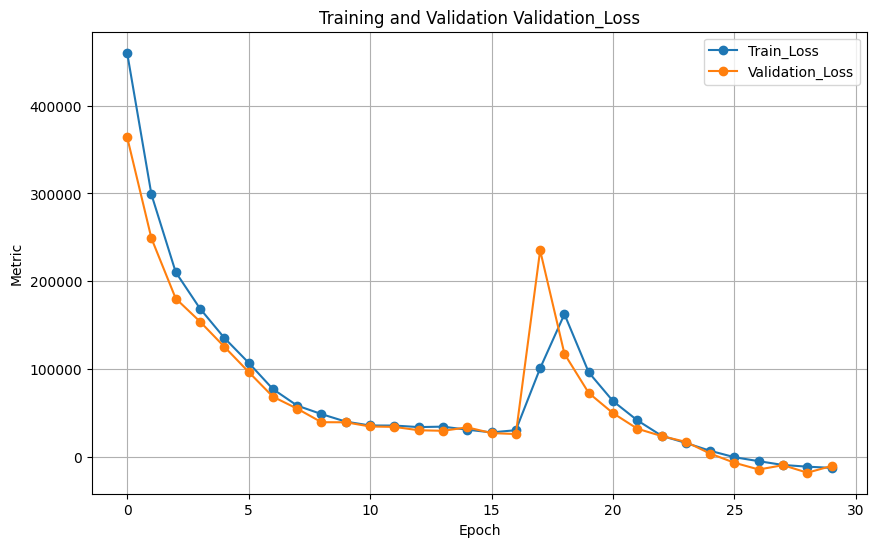

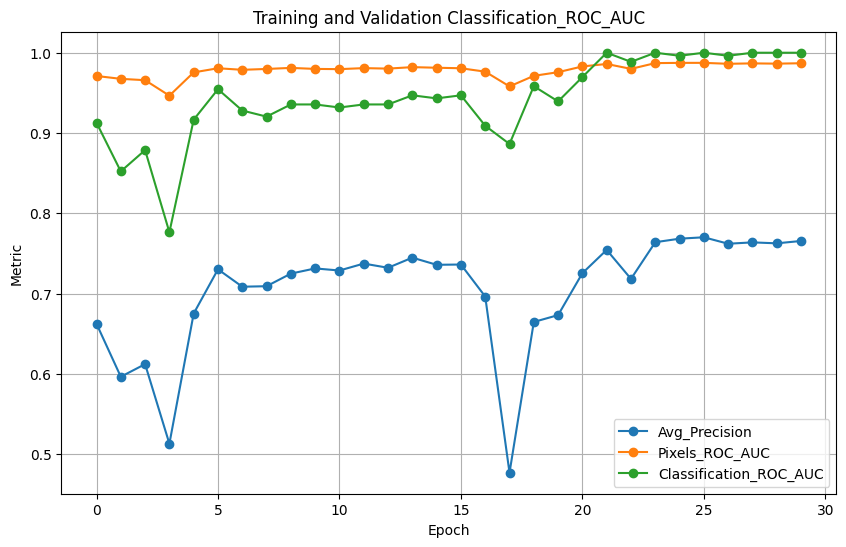

In [ ]:
image_size = 384
model = FastflowModel(
        backbone="deit_base_distilled_patch16_384",
        flow_steps=5,
        input_size=[image_size, image_size],
        pre_trained=True
    )

trained_model = train_fastflow_with_validation(
    model=model,
    train_dataset=train_dataset,
    segmentation_dataset=segmentation_val_dataset,
    classification_dataset=classification_val_dataset,
    num_epochs=30,
    learning_rate=0.01,
    weight_decay=5e-5,
    device=device,
    log_interval=2,
    log_dir=f"../experiments/{class_name}/final",
    batch_size=16,
    resume_from_checkpoint=False,
    freeze_extractor=True,
    early_stopping_patience=8,
    early_stopping_metric="Pixels_ROC_AUC",
    early_stopping_mode="max"
)

Подбор гиперпараметров через optuna с Pixel ROC AUC в качестве метрики качества

In [ ]:
import optuna
from optuna.trial import TrialState
import torch
import os
from torch.utils.data import DataLoader

logs_path = "optuna_3"

def objective(trial):
    # --- Путь для логов (уникальный для каждого trial) ---
    os.makedirs("../experiments", exist_ok=True)
    lg_dir = f"trial_{trial.number}"
    log_dir = os.path.join("../experiments", class_name)
    os.makedirs(log_dir, exist_ok=True)
    log_dir = os.path.join(log_dir, logs_path)
    os.makedirs(log_dir, exist_ok=True)
    log_dir = os.path.join(log_dir, lg_dir)
    os.makedirs(log_dir, exist_ok=True)

    # --- Гиперпараметры для оптимизации ---
    flow_steps_num = trial.suggest_int("flow_steps", 3, 5)
    lr = trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True)
    weight_decay = trial.suggest_float("weight_decay", 1e-7, 1e-2, log=True)
    batch_size = trial.suggest_int("batch_size", 4, 8)
    backbone = trial.suggest_categorical("backbone", ["deit_base_distilled_patch16_384", "wide_resnet50_2"])
    # augmentation_flag = trial.suggest_categorical("augmentation", [False, True])
    if backbone == "wide_resnet50_2":
        trained_img_size = trial.suggest_categorical("image_size", [256, 320, 384, 448])
    else:
        trained_img_size = 384

    # train_dataset = Train_Dataset(dataset_path, class_name, get_augmented_transformer(trained_img_size))
    train_dataset = Train_Dataset(dataset_path, class_name, get_transformer(trained_img_size))
    segmentation_val_dataset, _ = train_test_split(Segmentation_Dataset(dataset_path, class_name, get_transformer(trained_img_size), test_classes=test_groups), test_size=0.5, random_state=42, shuffle=True)
    classification_val_dataset, _ = train_test_split(Classification_Dataset(dataset_path, class_name, get_transformer(trained_img_size), test_classes=test_groups), test_size=0.5, random_state=42, shuffle=True)
    
    # Сохранение параметров обучения
    params_path = os.path.join(log_dir, "params.txt")
    with open(params_path, "w") as f:
        f.write(f"flow_steps_num: {flow_steps_num}\n")
        f.write(f"learning_rate: {lr}\n")
        f.write(f"weight_decay: {weight_decay}\n")
        f.write(f"backbone: {backbone}\n")
        f.write(f"batch_size: {batch_size}\n")
        f.write(f"image_size: {trained_img_size}")

    # --- Создание модели ---
    model = FastflowModel(
        backbone=backbone,
        flow_steps=flow_steps_num,
        input_size=[trained_img_size, trained_img_size],
        pre_trained=True
    )

    # --- Обучение модели ---
    try:
        trained_model = train_fastflow_with_validation(
            model=model,
            train_dataset=train_dataset,
            segmentation_dataset=segmentation_val_dataset,
            classification_dataset=classification_val_dataset,
            num_epochs=20,
            learning_rate=lr,
            weight_decay=weight_decay,
            device=device,
            log_interval=4,
            log_dir=log_dir,
            batch_size=batch_size,
            resume_from_checkpoint=False,
            freeze_extractor=True,
            early_stopping_patience=6,
            early_stopping_metric="Pixels_ROC_AUC",
            early_stopping_mode="max"
        )
    except Exception as e:
        print(f"Trial {trial.number} failed with error: {e}")
        raise optuna.TrialPruned()

    # Загрузка метрик из файла или из возвращаемого значения

    metrics_path = os.path.join(log_dir, "final_metrics.txt")
    if not os.path.exists(metrics_path):
        raise optuna.TrialPruned()

    with open(metrics_path, "r") as f:
        lines = f.readlines()
        metrics = {}
        for line in lines:
            if ":" in line:
                key, val = line.strip().split(":")
                metrics[key.strip()] = float(val.strip())

    # Целевая метрика для оптимизации
    target_metric = "Pixels_ROC_AUC"
    if target_metric not in metrics:
        raise optuna.TrialPruned()
    
    necessary_metric = "Classification_ROC_AUC"
    if necessary_metric not in metrics:
        raise optuna.TrialPruned()

    score = metrics[target_metric] + (metrics[necessary_metric] - 1.)
    return score


# Настройка и запуск Optuna
def run_optuna_optimization(n_trials=50, study_name="fastflow_optimization", storage="sqlite:///fastflow_opt.db"):
    study = optuna.create_study(
        study_name=study_name,
        direction="maximize",
        storage=storage,
        load_if_exists=True
    )

    study.optimize(objective, n_trials=n_trials, n_jobs=1)

    # Вывод лучших результатов
    pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
    complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

    print("\nStudy statistics: ")
    print(f"  Number of finished trials: {len(study.trials)}")
    print(f"  Number of pruned trials: {len(pruned_trials)}")
    print(f"  Number of complete trials: {len(complete_trials)}")

    print("\nBest trial:")
    trial = study.best_trial
    print(f"  Value: {trial.value}")
    print("  Params: ")
    for key, value in trial.params.items():
        print(f"    {key}: {value}")
    print("\n")


    # Сохранение параметров обучения
    best_trial_folder = os.path.join("../experiments", class_name, logs_path, "best_trial")
    os.makedirs(best_trial_folder, exist_ok=True)
    best_trial_path = os.path.join(best_trial_folder, "best_params.txt")
    with open(best_trial_path, "w") as f:
        f.write(f"Value: {trial.value}\n")
        f.write(f"Trial number: {trial.number}\n")
        for key, value in trial.params.items():
            f.write(f"{key}: {value}\n")

    return study

In [ ]:
# study = run_optuna_optimization(n_trials=30)

# Тестирование лучшей обученной модели

In [312]:
device="cuda" if torch.cuda.is_available() else "cpu"
print(device)
print(f"Название GPU: {torch.cuda.get_device_name(torch.cuda.current_device())}")

cuda
Название GPU: NVIDIA GeForce RTX 3070 Ti Laptop GPU


In [313]:
logs_path = "final"

In [314]:
def predict_with_augmentations(model, img, true_img_size=None):
    """
    Предсказание с усреднением по исходному изображению и его отражениям
    """
    aug_anomaly_maps = []
    
    # Исходное изображение
    with torch.no_grad():
        anomaly_map = model(img).anomaly_map + 1.
        aug_anomaly_maps.append(anomaly_map)
    
    # # Горизонтальное отражение
    # with torch.no_grad():
    #     img_flip_h = torch.flip(img, dims=[-1])
    #     anomaly_map_flip_h = model(img_flip_h).anomaly_map + 1.
    #     # Возвращаем к исходной ориентации
    #     anomaly_map_flip_h = torch.flip(anomaly_map_flip_h, dims=[-1])
    #     aug_anomaly_maps.append(anomaly_map_flip_h)
    
    # # Вертикальное отражение (опционально, если имеет смысл для ваших данных)
    # with torch.no_grad():
    #     img_flip_v = torch.flip(img, dims=[-2])
    #     anomaly_map_flip_v = model(img_flip_v).anomaly_map + 1.
    #     # Возвращаем к исходной ориентации
    #     anomaly_map_flip_v = torch.flip(anomaly_map_flip_v, dims=[-2])
    #     aug_anomaly_maps.append(anomaly_map_flip_v)
    
    # Усреднение аномалийных карт
    avg_anomaly_map = torch.mean(torch.stack(aug_anomaly_maps), dim=0)
    
    if true_img_size is not None:
        avg_anomaly_map = postprocess_anomaly_map(avg_anomaly_map, true_img_size=true_img_size)
    
    return avg_anomaly_map

Segmentation Test:   0%|          | 0/24 [00:00<?, ?it/s]

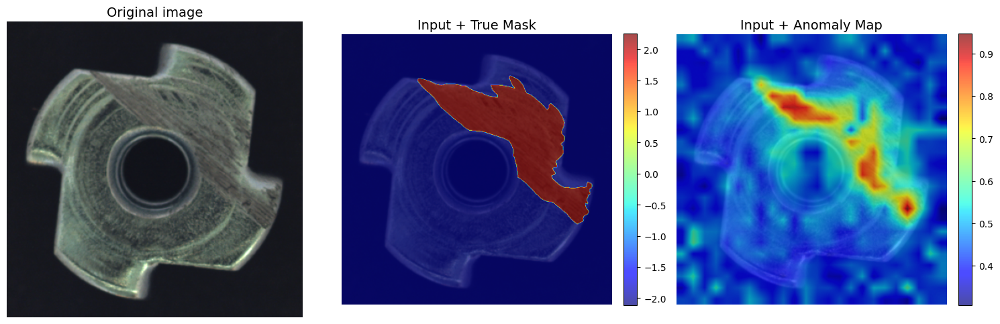

Segmentation Test:  17%|█▋        | 4/24 [00:00<00:03,  5.79it/s]

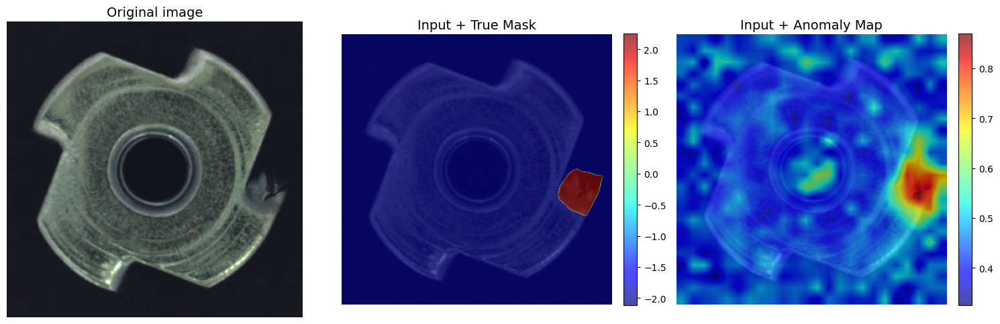

Segmentation Test:  29%|██▉       | 7/24 [00:01<00:03,  5.49it/s]

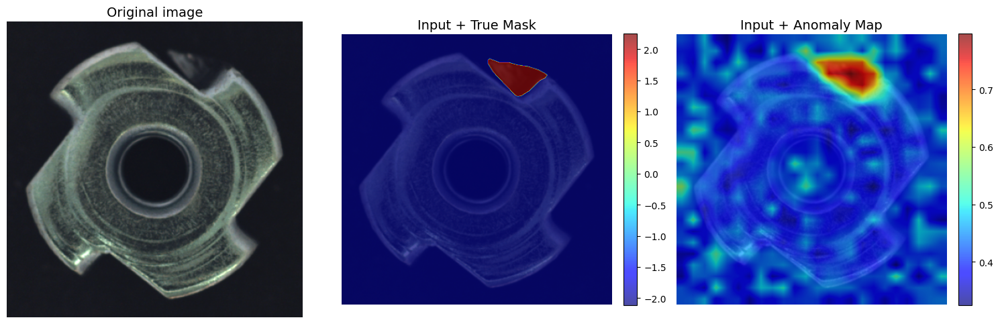

Segmentation Test:  46%|████▌     | 11/24 [00:02<00:02,  5.85it/s]

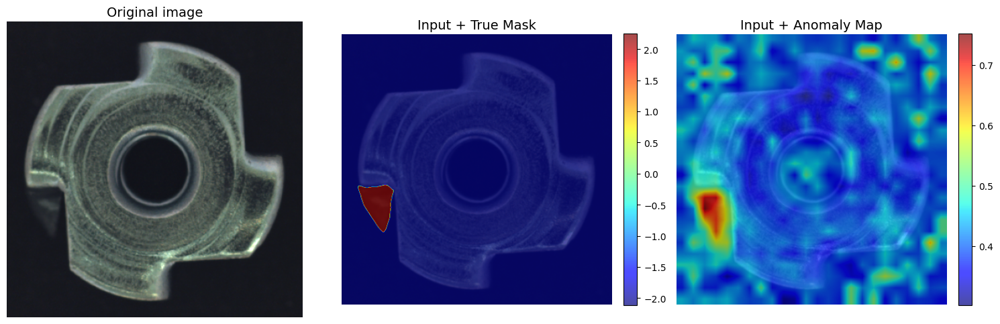

Segmentation Test:  67%|██████▋   | 16/24 [00:03<00:01,  6.60it/s]

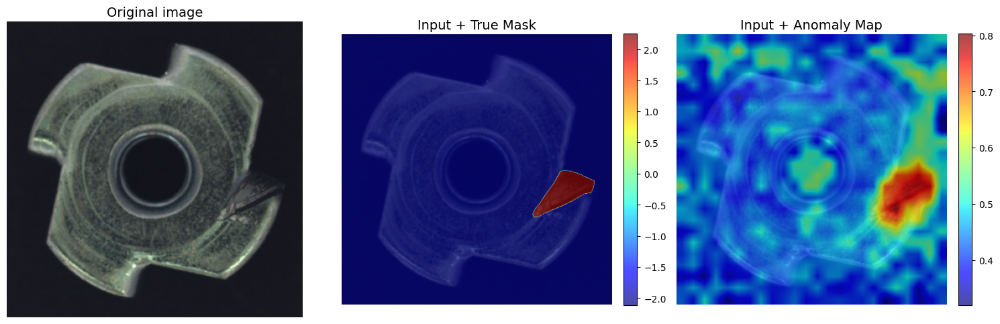

Segmentation Test:  79%|███████▉  | 19/24 [00:03<00:00,  5.83it/s]

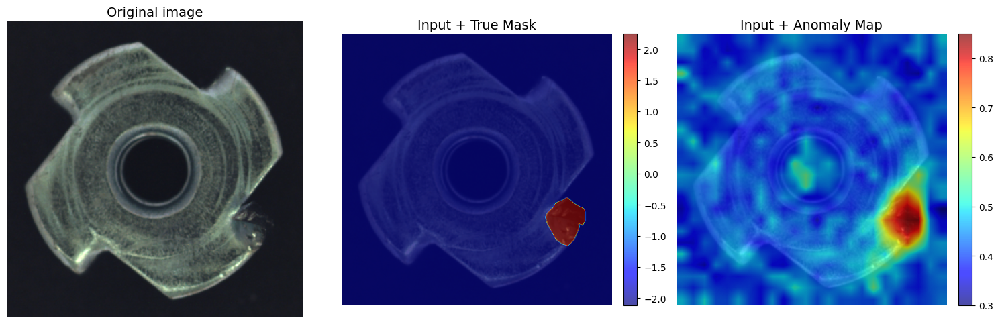

Classification Test:   0%|          | 0/35 [00:00<?, ?it/s]       

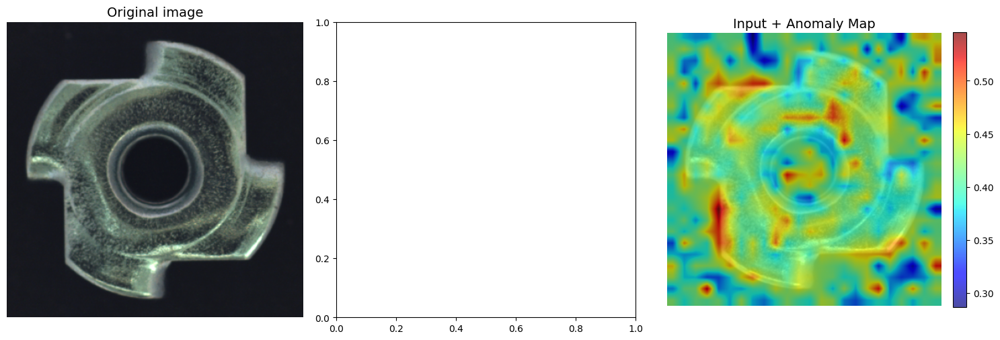

Classification Test:   3%|▎         | 1/35 [00:00<00:11,  2.95it/s]

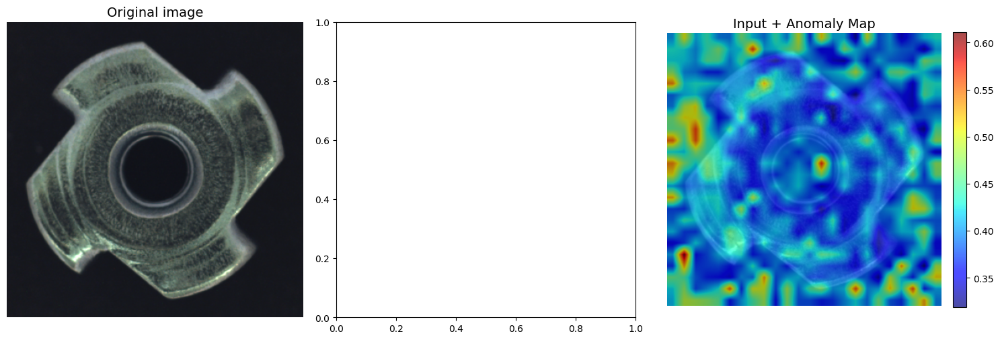

Classification Test:  17%|█▋        | 6/35 [00:00<00:03,  8.67it/s]

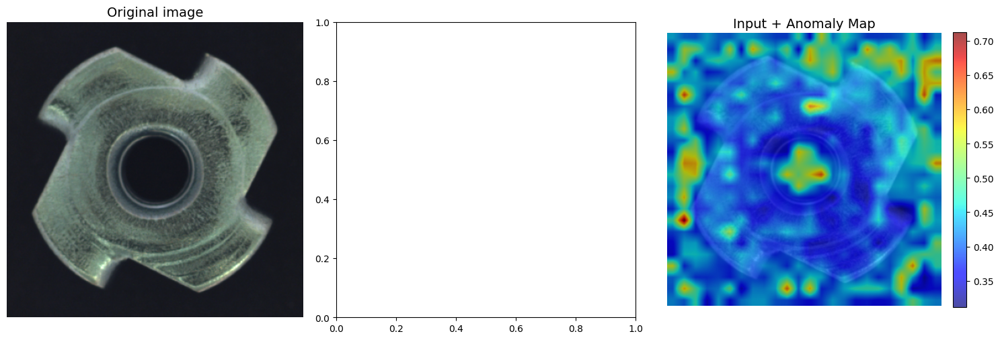

Classification Test:  23%|██▎       | 8/35 [00:01<00:03,  7.15it/s]

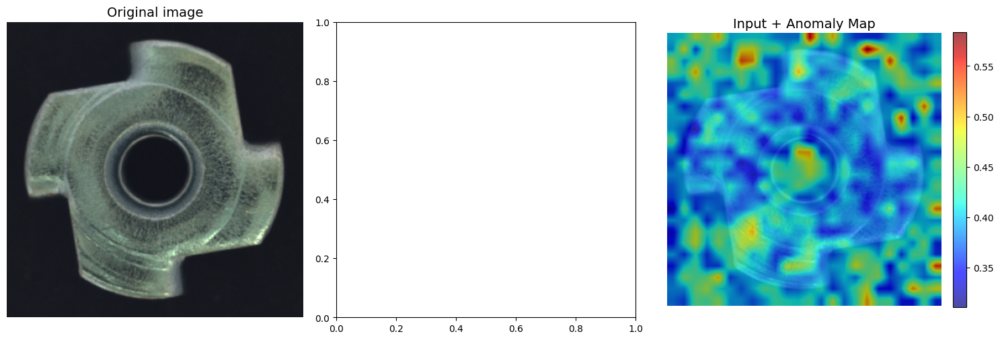

Classification Test:  51%|█████▏    | 18/35 [00:01<00:01, 15.45it/s]

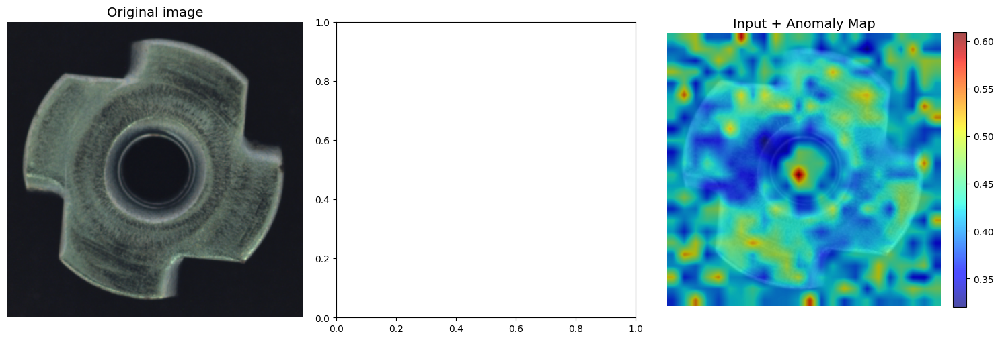

Classification Test:  63%|██████▎   | 22/35 [00:02<00:00, 13.54it/s]

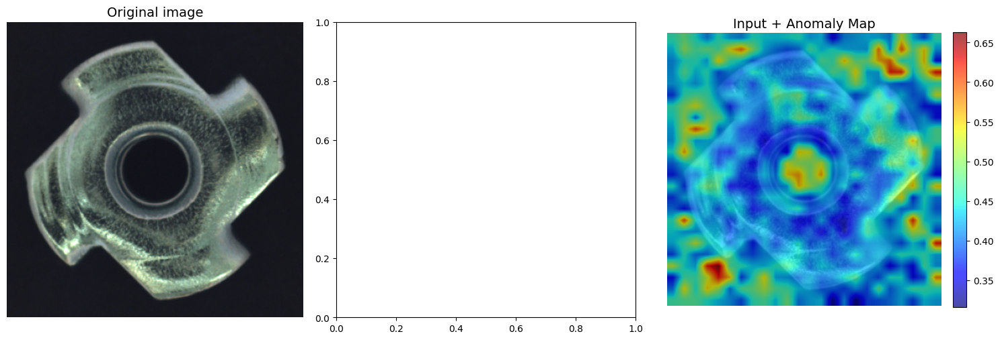

Classification Test:  77%|███████▋  | 27/35 [00:02<00:00, 13.57it/s]

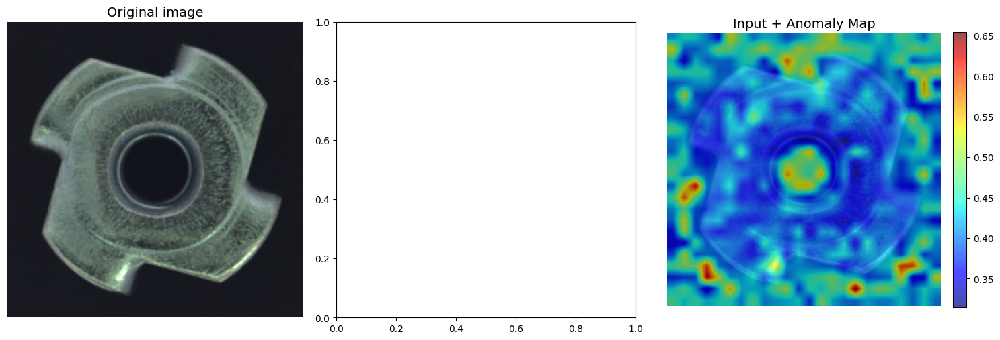

Classification Test:  83%|████████▎ | 29/35 [00:02<00:00, 11.29it/s]

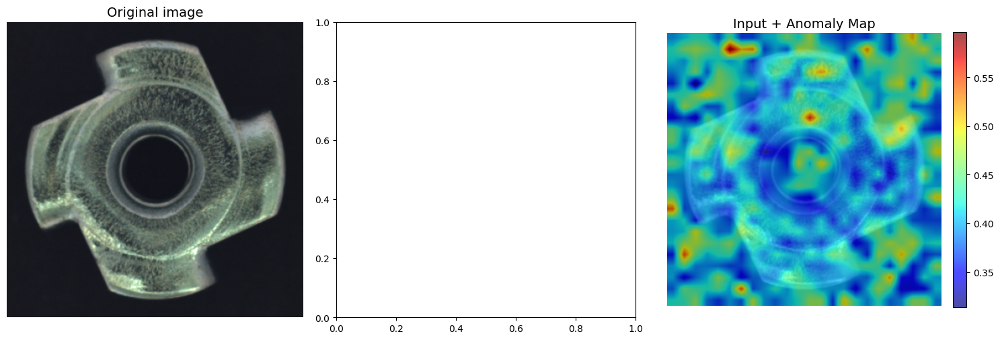

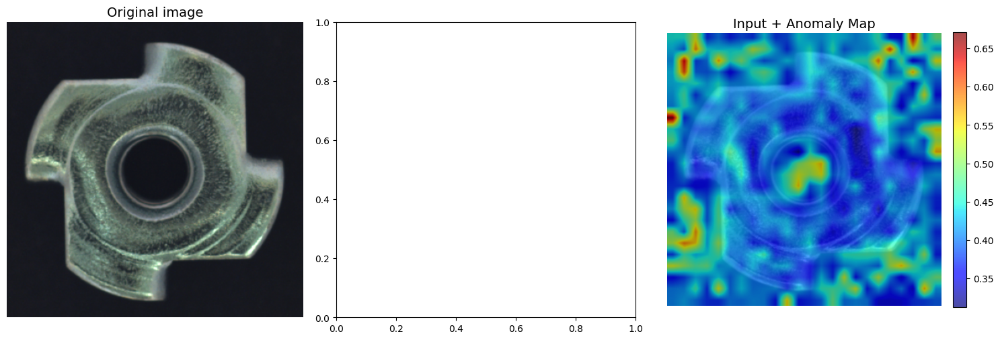

Classification Test:  89%|████████▊ | 31/35 [00:03<00:00,  7.46it/s]

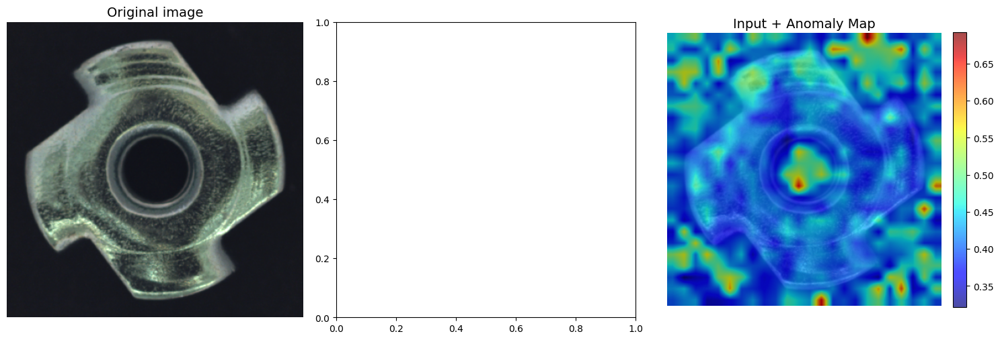

Classification Test:  94%|█████████▍| 33/35 [00:03<00:00,  7.03it/s]

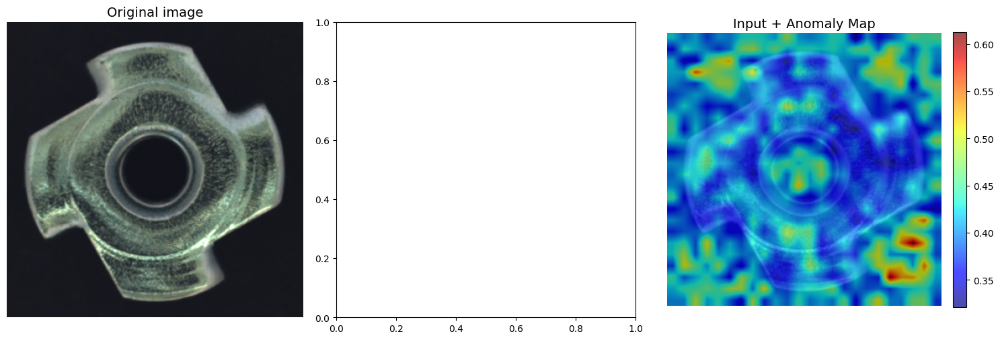

Average pixel precision score: 0.7901482582092285
Average pixel ROC AUC score: 0.9842068552970886
Average image ROC AUC score: 0.9772727272727273


In [ ]:
# Загрузка лучшей модели
best_model_path = os.path.join("../experiments", class_name, logs_path, "trained_model.pth")
best_trained_model = torch.load(best_model_path, weights_only=False)
# Замер качества на тестовой выборке
best_trained_model.to(device)
best_trained_model.eval()

# Тест сегментации
precision_scores = []
roc_auc_scores = []
with torch.no_grad():
    for i in tqdm(range(len(segmentation_test_dataset)), desc="Segmentation Test", leave=False):
        img, true_mask = segmentation_test_dataset[i]
        img = img.unsqueeze(0).to(device)
        
        anomaly_map = predict_with_augmentations(best_trained_model, img)
        anomaly_map = postprocess_anomaly_map(anomaly_map, true_img_size=(true_mask.shape[-2], true_mask.shape[-1]))
        
        img_precision = pixel_avg_precision(anomaly_map, true_mask)
        precision_scores.append(img_precision)

        img_roc_auc = pixel_roc_auc(anomaly_map, true_mask)
        roc_auc_scores.append(img_roc_auc)

        if i % 4 == 0:
            visualize_results(img, anomaly_map, true_mask=true_mask)
        


avg_precision_score = torch.tensor(precision_scores).mean().item()
avg_roc_auc_score = torch.tensor(roc_auc_scores).mean().item()

# Тест классификации
predicted_scores = []
true_labels = []
with torch.no_grad():
    for i in tqdm(range(len(classification_test_dataset)), desc="Classification Test", leave=False):
        img, true_label = classification_test_dataset[i]
        img = img.unsqueeze(0).to(device)

        anomaly_map = best_trained_model(img).anomaly_map + 1.
        img_score = predict_label(anomaly_map)

        predicted_scores.append(img_score)
        true_labels.append(true_label)
        if not true_label:
            visualize_results(img, anomaly_map)

cls_score = roc_auc_score(true_labels, predicted_scores)

print(f"Average pixel precision score: {avg_precision_score}")
print(f"Average pixel ROC AUC score: {avg_roc_auc_score}")
print(f"Average image ROC AUC score: {cls_score}")

С нормализацией

Average pixel precision score: 0.7706021666526794

Average pixel ROC AUC score: 0.9848958849906921

Average image ROC AUC score: 1.0

Без нормализации

Average pixel precision score: 0.723240852355957

Average pixel ROC AUC score: 0.9808266162872314

Average image ROC AUC score: 0.9863945578231292

Предыдущие (другой scheduler и малый batch size)

Average pixel precision score: 0.7965647578239441
Average pixel ROC AUC score: 0.9814310073852539
Average image ROC AUC score: 0.9931972789115646

Average pixel precision score: 0.7413554787635803
Average pixel ROC AUC score: 0.982745885848999
Average image ROC AUC score: 1.0

Average pixel precision score: 0.7518733143806458
Average pixel ROC AUC score: 0.9838638305664062
Average image ROC AUC score: 1.0